In [1]:
# Install dependencies (run once)
!pip install diffusers datasets transformers accelerate scipy ftfy torch torchvision

# Imports
import torch
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torchvision import transforms
from datasets import load_dataset
from diffusers import UNet2DModel, DDPMScheduler
from PIL import Image

# -------------------------------
# 1. Load the dataset safely
# -------------------------------
dataset_dict = load_dataset(
    "imagefolder",
    data_files={"train": "hf://datasets/licmajster/Animals_Recognition/*"}
)

# Select the 'train' split
train_dataset = dataset_dict["train"]

# Limit to 821 images (matches actual available files)
train_dataset = train_dataset.select(range(821))
print(f"Number of images: {len(train_dataset)}")

# -------------------------------
# 2. Preprocessing / transforms
# -------------------------------
image_size = 64
preprocess = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5]),  # scale to [-1,1]
])

def transform(examples):
    # Convert PIL images to tensors
    examples["pixel_values"] = [preprocess(img.convert("RGB")) for img in examples["image"]]
    return examples

train_dataset.set_transform(transform)

# -------------------------------
# 3. PyTorch Dataset wrapper
# -------------------------------
class TensorDataset(torch.utils.data.Dataset):
    def __init__(self, hf_dataset):
        self.hf_dataset = hf_dataset
    def __len__(self):
        return len(self.hf_dataset)
    def __getitem__(self, idx):
        return self.hf_dataset[idx]["pixel_values"]

tensor_dataset = TensorDataset(train_dataset)

# -------------------------------
# 4. DataLoader
# -------------------------------
batch_size = 16
train_dataloader = DataLoader(tensor_dataset, batch_size=batch_size, shuffle=True)

# -------------------------------
# 5. Define model and scheduler
# -------------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"

model = UNet2DModel(
    sample_size=image_size,
    in_channels=3,
    out_channels=3,
    layers_per_block=2,
    block_out_channels=(64, 128, 256, 512),
    down_block_types=("DownBlock2D", "DownBlock2D", "AttnDownBlock2D", "AttnDownBlock2D"),
    up_block_types=("AttnUpBlock2D", "AttnUpBlock2D", "UpBlock2D", "UpBlock2D"),
).to(device)

noise_scheduler = DDPMScheduler(num_train_timesteps=1000)

optimizer = torch.optim.AdamW(model.parameters(), lr=2e-5)

# -------------------------------
# 6. Training loop
# -------------------------------
num_epochs = 10

for epoch in range(num_epochs):
    for step, batch in enumerate(train_dataloader):
        clean_images = batch.to(device)
        noise = torch.randn_like(clean_images).to(device)
        timesteps = torch.randint(
            0, noise_scheduler.config.num_train_timesteps,
            (clean_images.shape[0],), device=device
        ).long()

        noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)
        noise_pred = model(noisy_images, timesteps).sample
        loss = F.mse_loss(noise_pred, noise)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if step % 10 == 0:
            print(f"Epoch {epoch}, Step {step}: Loss = {loss.item():.6f}")

# -------------------------------
# 7. Save the model
# -------------------------------
torch.save(model.state_dict(), "animal_diffusion_model.pth")
print("Model saved as animal_diffusion_model.pth")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.4 MB/s eta 0:00:00


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Resolving data files:   0%|          | 0/821 [00:00<?, ?it/s]

deer_276.jpg:   0%|          | 0.00/835k [00:00<?, ?B/s]

deer_274.jpg:   0%|          | 0.00/242k [00:00<?, ?B/s]

deer_272.jpg:   0%|          | 0.00/1.46M [00:00<?, ?B/s]

deer_275.jpg:   0%|          | 0.00/2.38M [00:00<?, ?B/s]

deer_271.jpg:   0%|          | 0.00/174k [00:00<?, ?B/s]

deer_268.jpg:   0%|          | 0.00/246k [00:00<?, ?B/s]

deer_270.jpg:   0%|          | 0.00/950k [00:00<?, ?B/s]

deer_258.jpg:   0%|          | 0.00/214k [00:00<?, ?B/s]

deer_269.jpg:   0%|          | 0.00/242k [00:00<?, ?B/s]

deer_250.jpg:   0%|          | 0.00/386k [00:00<?, ?B/s]

deer_261.jpg:   0%|          | 0.00/1.01M [00:00<?, ?B/s]

deer_265.jpg:   0%|          | 0.00/4.13M [00:00<?, ?B/s]

deer_266.jpg:   0%|          | 0.00/382k [00:00<?, ?B/s]

deer_255.jpg:   0%|          | 0.00/2.02M [00:00<?, ?B/s]

deer_273.jpg:   0%|          | 0.00/1.52M [00:00<?, ?B/s]

deer_252.jpg:   0%|          | 0.00/1.49M [00:00<?, ?B/s]

deer_277.jpg:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

deer_284.jpg:   0%|          | 0.00/304k [00:00<?, ?B/s]

deer_283.jpg:   0%|          | 0.00/552k [00:00<?, ?B/s]

deer_279.jpg:   0%|          | 0.00/332k [00:00<?, ?B/s]

deer_280.jpg:   0%|          | 0.00/517k [00:00<?, ?B/s]

deer_278.jpg:   0%|          | 0.00/1.87M [00:00<?, ?B/s]

deer_281.jpg:   0%|          | 0.00/202k [00:00<?, ?B/s]

deer_285.jpg:   0%|          | 0.00/596k [00:00<?, ?B/s]

deer_287.jpg:   0%|          | 0.00/819k [00:00<?, ?B/s]

deer_290.jpg:   0%|          | 0.00/727k [00:00<?, ?B/s]

deer_289.jpg:   0%|          | 0.00/883k [00:00<?, ?B/s]

deer_291.jpg:   0%|          | 0.00/1.47M [00:00<?, ?B/s]

deer_288.jpg:   0%|          | 0.00/485k [00:00<?, ?B/s]

deer_292.jpg:   0%|          | 0.00/281k [00:00<?, ?B/s]

deer_293.jpg:   0%|          | 0.00/227k [00:00<?, ?B/s]

deer_295.jpg:   0%|          | 0.00/1.73M [00:00<?, ?B/s]

deer_299.jpg:   0%|          | 0.00/734k [00:00<?, ?B/s]

deer_294.jpg:   0%|          | 0.00/67.8k [00:00<?, ?B/s]

deer_300.jpg:   0%|          | 0.00/277k [00:00<?, ?B/s]

deer_301.jpg:   0%|          | 0.00/535k [00:00<?, ?B/s]

deer_302.jpg:   0%|          | 0.00/251k [00:00<?, ?B/s]

deer_303.jpg:   0%|          | 0.00/86.5k [00:00<?, ?B/s]

deer_307.jpg:   0%|          | 0.00/253k [00:00<?, ?B/s]

deer_306.jpg:   0%|          | 0.00/2.86M [00:00<?, ?B/s]

deer_308.jpg:   0%|          | 0.00/153k [00:00<?, ?B/s]

deer_309.jpg:   0%|          | 0.00/126k [00:00<?, ?B/s]

deer_310.jpg:   0%|          | 0.00/213k [00:00<?, ?B/s]

deer_311.jpg:   0%|          | 0.00/66.3k [00:00<?, ?B/s]

deer_312.jpg:   0%|          | 0.00/251k [00:00<?, ?B/s]

deer_314.jpg:   0%|          | 0.00/164k [00:00<?, ?B/s]

deer_313.jpg:   0%|          | 0.00/270k [00:00<?, ?B/s]

deer_316.jpg:   0%|          | 0.00/305k [00:00<?, ?B/s]

deer_317.jpg:   0%|          | 0.00/236k [00:00<?, ?B/s]

deer_318.jpg:   0%|          | 0.00/165k [00:00<?, ?B/s]

deer_324.jpg:   0%|          | 0.00/393k [00:00<?, ?B/s]

deer_321.jpg:   0%|          | 0.00/324k [00:00<?, ?B/s]

deer_322.jpg:   0%|          | 0.00/91.0k [00:00<?, ?B/s]

deer_328.jpg:   0%|          | 0.00/1.44M [00:00<?, ?B/s]

deer_327.jpg:   0%|          | 0.00/204k [00:00<?, ?B/s]

deer_325.jpg:   0%|          | 0.00/106k [00:00<?, ?B/s]

deer_323.jpg:   0%|          | 0.00/262k [00:00<?, ?B/s]

deer_330.jpg:   0%|          | 0.00/413k [00:00<?, ?B/s]

deer_333.jpg:   0%|          | 0.00/767k [00:00<?, ?B/s]

deer_334.jpg:   0%|          | 0.00/1.30M [00:00<?, ?B/s]

deer_336.jpg:   0%|          | 0.00/55.8k [00:00<?, ?B/s]

deer_335.jpg:   0%|          | 0.00/378k [00:00<?, ?B/s]

deer_340.jpg:   0%|          | 0.00/175k [00:00<?, ?B/s]

deer_341.jpg:   0%|          | 0.00/251k [00:00<?, ?B/s]

deer_339.jpg:   0%|          | 0.00/205k [00:00<?, ?B/s]

deer_337.jpg:   0%|          | 0.00/133k [00:00<?, ?B/s]

deer_344.jpg:   0%|          | 0.00/1.32M [00:00<?, ?B/s]

deer_345.jpg:   0%|          | 0.00/1.23M [00:00<?, ?B/s]

deer_342.jpg:   0%|          | 0.00/485k [00:00<?, ?B/s]

deer_351.jpg:   0%|          | 0.00/184k [00:00<?, ?B/s]

deer_354.jpg:   0%|          | 0.00/107k [00:00<?, ?B/s]

deer_347.jpg:   0%|          | 0.00/358k [00:00<?, ?B/s]

deer_352.jpg:   0%|          | 0.00/482k [00:00<?, ?B/s]

deer_346.jpg:   0%|          | 0.00/210k [00:00<?, ?B/s]

deer_348.jpg:   0%|          | 0.00/1.14M [00:00<?, ?B/s]

deer_353.jpg:   0%|          | 0.00/717k [00:00<?, ?B/s]

deer_355.jpg:   0%|          | 0.00/319k [00:00<?, ?B/s]

deer_360.jpg:   0%|          | 0.00/222k [00:00<?, ?B/s]

deer_356.jpg:   0%|          | 0.00/1.23M [00:00<?, ?B/s]

deer_362.jpg:   0%|          | 0.00/361k [00:00<?, ?B/s]

deer_361.jpg:   0%|          | 0.00/1.13M [00:00<?, ?B/s]

deer_365.jpg:   0%|          | 0.00/152k [00:00<?, ?B/s]

deer_366.jpg:   0%|          | 0.00/370k [00:00<?, ?B/s]

deer_367.jpg:   0%|          | 0.00/295k [00:00<?, ?B/s]

deer_368.jpg:   0%|          | 0.00/80.4k [00:00<?, ?B/s]

deer_369.jpg:   0%|          | 0.00/126k [00:00<?, ?B/s]

deer_370.jpg:   0%|          | 0.00/167k [00:00<?, ?B/s]

deer_375.jpg:   0%|          | 0.00/70.6k [00:00<?, ?B/s]

deer_371.jpg:   0%|          | 0.00/242k [00:00<?, ?B/s]

deer_373.jpg:   0%|          | 0.00/665k [00:00<?, ?B/s]

deer_376.jpg:   0%|          | 0.00/139k [00:00<?, ?B/s]

deer_374.jpg:   0%|          | 0.00/82.2k [00:00<?, ?B/s]

deer_372.jpg:   0%|          | 0.00/209k [00:00<?, ?B/s]

deer_378.jpg:   0%|          | 0.00/58.5k [00:00<?, ?B/s]

deer_384.jpg:   0%|          | 0.00/72.9k [00:00<?, ?B/s]

deer_383.jpg:   0%|          | 0.00/452k [00:00<?, ?B/s]

deer_386.jpg:   0%|          | 0.00/508k [00:00<?, ?B/s]

deer_385.jpg:   0%|          | 0.00/177k [00:00<?, ?B/s]

deer_387.jpg:   0%|          | 0.00/1.25M [00:00<?, ?B/s]

deer_388.jpg:   0%|          | 0.00/541k [00:00<?, ?B/s]

deer_381.jpg:   0%|          | 0.00/71.2k [00:00<?, ?B/s]

deer_392.jpg:   0%|          | 0.00/294k [00:00<?, ?B/s]

deer_393.jpg:   0%|          | 0.00/305k [00:00<?, ?B/s]

deer_390.jpg:   0%|          | 0.00/101k [00:00<?, ?B/s]

deer_389.jpg:   0%|          | 0.00/157k [00:00<?, ?B/s]

deer_395.jpg:   0%|          | 0.00/230k [00:00<?, ?B/s]

deer_398.jpg:   0%|          | 0.00/39.4k [00:00<?, ?B/s]

deer_399.jpg:   0%|          | 0.00/184k [00:00<?, ?B/s]

deer_402.jpg:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

deer_400.jpg:   0%|          | 0.00/84.1k [00:00<?, ?B/s]

deer_401.jpg:   0%|          | 0.00/1.62M [00:00<?, ?B/s]

deer_411.jpg:   0%|          | 0.00/1.01M [00:00<?, ?B/s]

deer_414.jpg:   0%|          | 0.00/269k [00:00<?, ?B/s]

deer_417.jpg:   0%|          | 0.00/984k [00:00<?, ?B/s]

deer_410.jpg:   0%|          | 0.00/315k [00:00<?, ?B/s]

deer_412.jpg:   0%|          | 0.00/1.25M [00:00<?, ?B/s]

deer_415.jpg:   0%|          | 0.00/240k [00:00<?, ?B/s]

deer_403.jpg:   0%|          | 0.00/159k [00:00<?, ?B/s]

deer_418.jpg:   0%|          | 0.00/207k [00:00<?, ?B/s]

deer_419.jpg:   0%|          | 0.00/214k [00:00<?, ?B/s]

deer_422.jpg:   0%|          | 0.00/144k [00:00<?, ?B/s]

deer_421.jpg:   0%|          | 0.00/175k [00:00<?, ?B/s]

deer_420.jpg:   0%|          | 0.00/432k [00:00<?, ?B/s]

deer_423.jpg:   0%|          | 0.00/297k [00:00<?, ?B/s]

deer_424.jpg:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

deer_425.jpg:   0%|          | 0.00/69.0k [00:00<?, ?B/s]

deer_426.jpg:   0%|          | 0.00/74.0k [00:00<?, ?B/s]

deer_427.jpg:   0%|          | 0.00/142k [00:00<?, ?B/s]

deer_428.jpg:   0%|          | 0.00/157k [00:00<?, ?B/s]

deer_429.jpg:   0%|          | 0.00/467k [00:00<?, ?B/s]

deer_430.jpg:   0%|          | 0.00/280k [00:00<?, ?B/s]

deer_432.jpg:   0%|          | 0.00/114k [00:00<?, ?B/s]

deer_433.jpg:   0%|          | 0.00/287k [00:00<?, ?B/s]

deer_431.jpg:   0%|          | 0.00/38.4k [00:00<?, ?B/s]

deer_436.jpg:   0%|          | 0.00/302k [00:00<?, ?B/s]

deer_437.jpg:   0%|          | 0.00/128k [00:00<?, ?B/s]

deer_438.jpg:   0%|          | 0.00/108k [00:00<?, ?B/s]

deer_443.jpg:   0%|          | 0.00/135k [00:00<?, ?B/s]

deer_446.jpg:   0%|          | 0.00/783k [00:00<?, ?B/s]

deer_439.jpg:   0%|          | 0.00/231k [00:00<?, ?B/s]

deer_441.jpg:   0%|          | 0.00/500k [00:00<?, ?B/s]

deer_442.jpg:   0%|          | 0.00/76.5k [00:00<?, ?B/s]

deer_444.jpg:   0%|          | 0.00/102k [00:00<?, ?B/s]

deer_447.jpg:   0%|          | 0.00/1.52M [00:00<?, ?B/s]

deer_449.jpg:   0%|          | 0.00/69.6k [00:00<?, ?B/s]

deer_448.jpg:   0%|          | 0.00/2.04M [00:00<?, ?B/s]

deer_451.jpg:   0%|          | 0.00/255k [00:00<?, ?B/s]

deer_453.jpg:   0%|          | 0.00/102k [00:00<?, ?B/s]

deer_452.jpg:   0%|          | 0.00/1.28M [00:00<?, ?B/s]

deer_454.jpg:   0%|          | 0.00/153k [00:00<?, ?B/s]

deer_455.jpg:   0%|          | 0.00/116k [00:00<?, ?B/s]

deer_456.jpg:   0%|          | 0.00/671k [00:00<?, ?B/s]

deer_458.jpg:   0%|          | 0.00/394k [00:00<?, ?B/s]

deer_457.jpg:   0%|          | 0.00/108k [00:00<?, ?B/s]

deer_459.jpg:   0%|          | 0.00/510k [00:00<?, ?B/s]

deer_460.jpg:   0%|          | 0.00/1.07M [00:00<?, ?B/s]

deer_463.jpg:   0%|          | 0.00/57.7k [00:00<?, ?B/s]

deer_462.jpg:   0%|          | 0.00/275k [00:00<?, ?B/s]

deer_461.jpg:   0%|          | 0.00/131k [00:00<?, ?B/s]

deer_465.jpg:   0%|          | 0.00/1.03M [00:00<?, ?B/s]

deer_464.jpg:   0%|          | 0.00/553k [00:00<?, ?B/s]

deer_469.jpg:   0%|          | 0.00/523k [00:00<?, ?B/s]

deer_466.jpg:   0%|          | 0.00/85.9k [00:00<?, ?B/s]

deer_467.jpg:   0%|          | 0.00/964k [00:00<?, ?B/s]

deer_475.jpg:   0%|          | 0.00/261k [00:00<?, ?B/s]

deer_473.jpg:   0%|          | 0.00/508k [00:00<?, ?B/s]

deer_472.jpg:   0%|          | 0.00/632k [00:00<?, ?B/s]

deer_474.jpg:   0%|          | 0.00/251k [00:00<?, ?B/s]

deer_478.jpg:   0%|          | 0.00/438k [00:00<?, ?B/s]

deer_476.jpg:   0%|          | 0.00/85.1k [00:00<?, ?B/s]

deer_477.jpg:   0%|          | 0.00/190k [00:00<?, ?B/s]

deer_482.jpg:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

deer_480.jpg:   0%|          | 0.00/467k [00:00<?, ?B/s]

deer_485.jpg:   0%|          | 0.00/73.0k [00:00<?, ?B/s]

deer_479.jpg:   0%|          | 0.00/143k [00:00<?, ?B/s]

deer_484.jpg:   0%|          | 0.00/278k [00:00<?, ?B/s]

deer_486.jpg:   0%|          | 0.00/204k [00:00<?, ?B/s]

deer_487.jpg:   0%|          | 0.00/832k [00:00<?, ?B/s]

deer_489.jpg:   0%|          | 0.00/1.41M [00:00<?, ?B/s]

deer_490.jpg:   0%|          | 0.00/194k [00:00<?, ?B/s]

deer_492.jpg:   0%|          | 0.00/48.3k [00:00<?, ?B/s]

deer_491.jpg:   0%|          | 0.00/479k [00:00<?, ?B/s]

deer_494.jpg:   0%|          | 0.00/303k [00:00<?, ?B/s]

deer_488.jpg:   0%|          | 0.00/513k [00:00<?, ?B/s]

deer_495.jpg:   0%|          | 0.00/382k [00:00<?, ?B/s]

deer_497.jpg:   0%|          | 0.00/108k [00:00<?, ?B/s]

dog_751.jpg:   0%|          | 0.00/407k [00:00<?, ?B/s]

deer_498.jpg:   0%|          | 0.00/87.8k [00:00<?, ?B/s]

deer_496.jpg:   0%|          | 0.00/34.2k [00:00<?, ?B/s]

dog_752.jpg:   0%|          | 0.00/661k [00:00<?, ?B/s]

deer_499.jpg:   0%|          | 0.00/46.1k [00:00<?, ?B/s]

dog_750.jpg:   0%|          | 0.00/259k [00:00<?, ?B/s]

dog_753.jpg:   0%|          | 0.00/308k [00:00<?, ?B/s]

dog_754.jpg:   0%|          | 0.00/358k [00:00<?, ?B/s]

dog_756.jpg:   0%|          | 0.00/2.58M [00:00<?, ?B/s]

dog_755.jpg:   0%|          | 0.00/215k [00:00<?, ?B/s]

dog_768.jpg:   0%|          | 0.00/4.81M [00:00<?, ?B/s]

dog_767.jpg:   0%|          | 0.00/321k [00:00<?, ?B/s]

dog_766.jpg:   0%|          | 0.00/244k [00:00<?, ?B/s]

dog_764.jpg:   0%|          | 0.00/282k [00:00<?, ?B/s]

dog_769.jpg:   0%|          | 0.00/681k [00:00<?, ?B/s]

dog_773.jpg:   0%|          | 0.00/229k [00:00<?, ?B/s]

dog_776.jpg:   0%|          | 0.00/232k [00:00<?, ?B/s]

dog_774.jpg:   0%|          | 0.00/648k [00:00<?, ?B/s]

dog_777.jpg:   0%|          | 0.00/48.1k [00:00<?, ?B/s]

dog_772.jpg:   0%|          | 0.00/352k [00:00<?, ?B/s]

dog_775.jpg:   0%|          | 0.00/432k [00:00<?, ?B/s]

dog_770.jpg:   0%|          | 0.00/40.6k [00:00<?, ?B/s]

dog_779.jpg:   0%|          | 0.00/15.9k [00:00<?, ?B/s]

dog_781.jpg:   0%|          | 0.00/333k [00:00<?, ?B/s]

dog_783.jpg:   0%|          | 0.00/130k [00:00<?, ?B/s]

dog_784.jpg:   0%|          | 0.00/334k [00:00<?, ?B/s]

dog_782.jpg:   0%|          | 0.00/680k [00:00<?, ?B/s]

dog_787.jpg:   0%|          | 0.00/73.0k [00:00<?, ?B/s]

dog_788.jpg:   0%|          | 0.00/90.4k [00:00<?, ?B/s]

dog_786.jpg:   0%|          | 0.00/32.4k [00:00<?, ?B/s]

dog_785.jpg:   0%|          | 0.00/527k [00:00<?, ?B/s]

dog_789.jpg:   0%|          | 0.00/321k [00:00<?, ?B/s]

dog_793.jpg:   0%|          | 0.00/345k [00:00<?, ?B/s]

dog_796.jpg:   0%|          | 0.00/438k [00:00<?, ?B/s]

dog_794.jpg:   0%|          | 0.00/45.0k [00:00<?, ?B/s]

dog_790.jpg:   0%|          | 0.00/720k [00:00<?, ?B/s]

dog_792.jpg:   0%|          | 0.00/185k [00:00<?, ?B/s]

dog_791.jpg:   0%|          | 0.00/1.50M [00:00<?, ?B/s]

dog_795.jpg:   0%|          | 0.00/83.6k [00:00<?, ?B/s]

dog_799.jpg:   0%|          | 0.00/373k [00:00<?, ?B/s]

dog_802.jpg:   0%|          | 0.00/68.6k [00:00<?, ?B/s]

dog_798.jpg:   0%|          | 0.00/79.4k [00:00<?, ?B/s]

dog_797.jpg:   0%|          | 0.00/822k [00:00<?, ?B/s]

dog_804.jpg:   0%|          | 0.00/78.3k [00:00<?, ?B/s]

dog_803.jpg:   0%|          | 0.00/442k [00:00<?, ?B/s]

dog_800.jpg:   0%|          | 0.00/854k [00:00<?, ?B/s]

dog_801.jpg:   0%|          | 0.00/3.22M [00:00<?, ?B/s]

dog_805.jpg:   0%|          | 0.00/86.5k [00:00<?, ?B/s]

dog_806.jpg:   0%|          | 0.00/145k [00:00<?, ?B/s]

dog_807.jpg:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

dog_811.jpg:   0%|          | 0.00/472k [00:00<?, ?B/s]

dog_810.jpg:   0%|          | 0.00/389k [00:00<?, ?B/s]

dog_809.jpg:   0%|          | 0.00/1.49M [00:00<?, ?B/s]

dog_812.jpg:   0%|          | 0.00/111k [00:00<?, ?B/s]

dog_813.jpg:   0%|          | 0.00/154k [00:00<?, ?B/s]

dog_816.jpg:   0%|          | 0.00/83.0k [00:00<?, ?B/s]

dog_815.jpg:   0%|          | 0.00/39.0k [00:00<?, ?B/s]

dog_814.jpg:   0%|          | 0.00/227k [00:00<?, ?B/s]

dog_817.jpg:   0%|          | 0.00/113k [00:00<?, ?B/s]

dog_819.jpg:   0%|          | 0.00/229k [00:00<?, ?B/s]

dog_818.jpg:   0%|          | 0.00/100k [00:00<?, ?B/s]

dog_820.jpg:   0%|          | 0.00/1.30M [00:00<?, ?B/s]

dog_821.jpg:   0%|          | 0.00/1.39M [00:00<?, ?B/s]

dog_824.jpg:   0%|          | 0.00/181k [00:00<?, ?B/s]

dog_828.jpg:   0%|          | 0.00/855k [00:00<?, ?B/s]

dog_823.jpg:   0%|          | 0.00/285k [00:00<?, ?B/s]

dog_826.jpg:   0%|          | 0.00/417k [00:00<?, ?B/s]

dog_829.jpg:   0%|          | 0.00/172k [00:00<?, ?B/s]

dog_831.jpg:   0%|          | 0.00/60.4k [00:00<?, ?B/s]

dog_832.jpg:   0%|          | 0.00/1.34M [00:00<?, ?B/s]

dog_825.jpg:   0%|          | 0.00/262k [00:00<?, ?B/s]

dog_834.jpg:   0%|          | 0.00/145k [00:00<?, ?B/s]

dog_835.jpg:   0%|          | 0.00/2.04M [00:00<?, ?B/s]

dog_837.jpg:   0%|          | 0.00/206k [00:00<?, ?B/s]

dog_839.jpg:   0%|          | 0.00/266k [00:00<?, ?B/s]

dog_833.jpg:   0%|          | 0.00/90.0k [00:00<?, ?B/s]

dog_840.jpg:   0%|          | 0.00/767k [00:00<?, ?B/s]

dog_842.jpg:   0%|          | 0.00/181k [00:00<?, ?B/s]

dog_838.jpg:   0%|          | 0.00/1.56M [00:00<?, ?B/s]

dog_843.jpg:   0%|          | 0.00/429k [00:00<?, ?B/s]

dog_844.jpg:   0%|          | 0.00/93.8k [00:00<?, ?B/s]

dog_845.jpg:   0%|          | 0.00/279k [00:00<?, ?B/s]

dog_841.jpg:   0%|          | 0.00/464k [00:00<?, ?B/s]

dog_846.jpg:   0%|          | 0.00/453k [00:00<?, ?B/s]

dog_847.jpg:   0%|          | 0.00/682k [00:00<?, ?B/s]

dog_848.jpg:   0%|          | 0.00/138k [00:00<?, ?B/s]

dog_849.jpg:   0%|          | 0.00/156k [00:00<?, ?B/s]

dog_851.jpg:   0%|          | 0.00/94.2k [00:00<?, ?B/s]

dog_850.jpg:   0%|          | 0.00/222k [00:00<?, ?B/s]

dog_852.jpg:   0%|          | 0.00/124k [00:00<?, ?B/s]

dog_854.jpg:   0%|          | 0.00/144k [00:00<?, ?B/s]

dog_853.jpg:   0%|          | 0.00/351k [00:00<?, ?B/s]

dog_855.jpg:   0%|          | 0.00/272k [00:00<?, ?B/s]

dog_856.jpg:   0%|          | 0.00/468k [00:00<?, ?B/s]

dog_857.jpg:   0%|          | 0.00/911k [00:00<?, ?B/s]

dog_858.jpg:   0%|          | 0.00/318k [00:00<?, ?B/s]

dog_859.jpg:   0%|          | 0.00/807k [00:00<?, ?B/s]

dog_861.jpg:   0%|          | 0.00/155k [00:00<?, ?B/s]

dog_862.jpg:   0%|          | 0.00/141k [00:00<?, ?B/s]

dog_863.jpg:   0%|          | 0.00/142k [00:00<?, ?B/s]

dog_864.jpg:   0%|          | 0.00/472k [00:00<?, ?B/s]

dog_865.jpg:   0%|          | 0.00/88.5k [00:00<?, ?B/s]

dog_867.jpg:   0%|          | 0.00/153k [00:00<?, ?B/s]

dog_866.jpg:   0%|          | 0.00/156k [00:00<?, ?B/s]

dog_868.jpg:   0%|          | 0.00/208k [00:00<?, ?B/s]

dog_869.jpg:   0%|          | 0.00/77.1k [00:00<?, ?B/s]

dog_871.jpg:   0%|          | 0.00/240k [00:00<?, ?B/s]

dog_873.jpg:   0%|          | 0.00/187k [00:00<?, ?B/s]

dog_870.jpg:   0%|          | 0.00/85.2k [00:00<?, ?B/s]

dog_874.jpg:   0%|          | 0.00/888k [00:00<?, ?B/s]

dog_877.jpg:   0%|          | 0.00/476k [00:00<?, ?B/s]

dog_876.jpg:   0%|          | 0.00/110k [00:00<?, ?B/s]

dog_878.jpg:   0%|          | 0.00/62.7k [00:00<?, ?B/s]

dog_879.jpg:   0%|          | 0.00/179k [00:00<?, ?B/s]

dog_880.jpg:   0%|          | 0.00/1.05M [00:00<?, ?B/s]

dog_885.jpg:   0%|          | 0.00/65.2k [00:00<?, ?B/s]

dog_881.jpg:   0%|          | 0.00/79.1k [00:00<?, ?B/s]

dog_882.jpg:   0%|          | 0.00/114k [00:00<?, ?B/s]

dog_884.jpg:   0%|          | 0.00/258k [00:00<?, ?B/s]

dog_887.jpg:   0%|          | 0.00/340k [00:00<?, ?B/s]

dog_889.jpg:   0%|          | 0.00/729k [00:00<?, ?B/s]

dog_888.jpg:   0%|          | 0.00/80.0k [00:00<?, ?B/s]

dog_890.jpg:   0%|          | 0.00/227k [00:00<?, ?B/s]

dog_891.jpg:   0%|          | 0.00/205k [00:00<?, ?B/s]

dog_892.jpg:   0%|          | 0.00/5.87M [00:00<?, ?B/s]

dog_893.jpg:   0%|          | 0.00/65.9k [00:00<?, ?B/s]

dog_895.jpg:   0%|          | 0.00/294k [00:00<?, ?B/s]

dog_896.jpg:   0%|          | 0.00/122k [00:00<?, ?B/s]

dog_897.jpg:   0%|          | 0.00/313k [00:00<?, ?B/s]

dog_901.jpg:   0%|          | 0.00/202k [00:00<?, ?B/s]

dog_902.jpg:   0%|          | 0.00/407k [00:00<?, ?B/s]

dog_898.jpg:   0%|          | 0.00/386k [00:00<?, ?B/s]

dog_903.jpg:   0%|          | 0.00/152k [00:00<?, ?B/s]

dog_900.jpg:   0%|          | 0.00/38.0k [00:00<?, ?B/s]

dog_905.jpg:   0%|          | 0.00/389k [00:00<?, ?B/s]

dog_910.jpg:   0%|          | 0.00/61.5k [00:00<?, ?B/s]

dog_907.jpg:   0%|          | 0.00/458k [00:00<?, ?B/s]

dog_906.jpg:   0%|          | 0.00/49.6k [00:00<?, ?B/s]

dog_904.jpg:   0%|          | 0.00/281k [00:00<?, ?B/s]

dog_911.jpg:   0%|          | 0.00/82.2k [00:00<?, ?B/s]

dog_908.jpg:   0%|          | 0.00/169k [00:00<?, ?B/s]

dog_909.jpg:   0%|          | 0.00/160k [00:00<?, ?B/s]

dog_912.jpg:   0%|          | 0.00/51.6k [00:00<?, ?B/s]

dog_913.jpg:   0%|          | 0.00/33.9k [00:00<?, ?B/s]

dog_918.jpg:   0%|          | 0.00/61.2k [00:00<?, ?B/s]

dog_914.jpg:   0%|          | 0.00/234k [00:00<?, ?B/s]

dog_915.jpg:   0%|          | 0.00/103k [00:00<?, ?B/s]

dog_921.jpg:   0%|          | 0.00/258k [00:00<?, ?B/s]

dog_920.jpg:   0%|          | 0.00/90.3k [00:00<?, ?B/s]

dog_916.jpg:   0%|          | 0.00/76.7k [00:00<?, ?B/s]

dog_923.jpg:   0%|          | 0.00/77.7k [00:00<?, ?B/s]

dog_928.jpg:   0%|          | 0.00/29.3k [00:00<?, ?B/s]

dog_922.jpg:   0%|          | 0.00/244k [00:00<?, ?B/s]

dog_924.jpg:   0%|          | 0.00/49.6k [00:00<?, ?B/s]

dog_930.jpg:   0%|          | 0.00/158k [00:00<?, ?B/s]

dog_926.jpg:   0%|          | 0.00/569k [00:00<?, ?B/s]

dog_929.jpg:   0%|          | 0.00/148k [00:00<?, ?B/s]

dog_925.jpg:   0%|          | 0.00/90.6k [00:00<?, ?B/s]

dog_932.jpg:   0%|          | 0.00/134k [00:00<?, ?B/s]

dog_937.jpg:   0%|          | 0.00/158k [00:00<?, ?B/s]

dog_935.jpg:   0%|          | 0.00/345k [00:00<?, ?B/s]

dog_936.jpg:   0%|          | 0.00/87.5k [00:00<?, ?B/s]

dog_939.jpg:   0%|          | 0.00/959k [00:00<?, ?B/s]

dog_931.jpg:   0%|          | 0.00/13.4k [00:00<?, ?B/s]

dog_938.jpg:   0%|          | 0.00/139k [00:00<?, ?B/s]

dog_940.jpg:   0%|          | 0.00/353k [00:00<?, ?B/s]

dog_941.jpg:   0%|          | 0.00/374k [00:00<?, ?B/s]

dog_945.jpg:   0%|          | 0.00/223k [00:00<?, ?B/s]

dog_947.jpg:   0%|          | 0.00/73.3k [00:00<?, ?B/s]

dog_946.jpg:   0%|          | 0.00/250k [00:00<?, ?B/s]

dog_943.jpg:   0%|          | 0.00/64.6k [00:00<?, ?B/s]

dog_944.jpg:   0%|          | 0.00/67.6k [00:00<?, ?B/s]

dog_948.jpg:   0%|          | 0.00/43.7k [00:00<?, ?B/s]

dog_949.jpg:   0%|          | 0.00/290k [00:00<?, ?B/s]

dog_951.jpg:   0%|          | 0.00/31.0k [00:00<?, ?B/s]

dog_958.jpg:   0%|          | 0.00/449k [00:00<?, ?B/s]

dog_956.jpg:   0%|          | 0.00/446k [00:00<?, ?B/s]

dog_952.jpg:   0%|          | 0.00/191k [00:00<?, ?B/s]

dog_954.jpg:   0%|          | 0.00/149k [00:00<?, ?B/s]

dog_959.jpg:   0%|          | 0.00/80.0k [00:00<?, ?B/s]

dog_955.jpg:   0%|          | 0.00/41.6k [00:00<?, ?B/s]

dog_960.jpg:   0%|          | 0.00/36.4k [00:00<?, ?B/s]

dog_966.jpg:   0%|          | 0.00/152k [00:00<?, ?B/s]

dog_970.jpg:   0%|          | 0.00/153k [00:00<?, ?B/s]

dog_962.jpg:   0%|          | 0.00/52.8k [00:00<?, ?B/s]

dog_969.jpg:   0%|          | 0.00/201k [00:00<?, ?B/s]

dog_963.jpg:   0%|          | 0.00/75.7k [00:00<?, ?B/s]

dog_967.jpg:   0%|          | 0.00/96.2k [00:00<?, ?B/s]

dog_968.jpg:   0%|          | 0.00/333k [00:00<?, ?B/s]

dog_961.jpg:   0%|          | 0.00/134k [00:00<?, ?B/s]

dog_964.jpg:   0%|          | 0.00/95.0k [00:00<?, ?B/s]

dog_971.jpg:   0%|          | 0.00/62.3k [00:00<?, ?B/s]

dog_972.jpg:   0%|          | 0.00/134k [00:00<?, ?B/s]

dog_973.jpg:   0%|          | 0.00/272k [00:00<?, ?B/s]

dog_975.jpg:   0%|          | 0.00/560k [00:00<?, ?B/s]

dog_974.jpg:   0%|          | 0.00/138k [00:00<?, ?B/s]

dog_977.jpg:   0%|          | 0.00/401k [00:00<?, ?B/s]

dog_978.jpg:   0%|          | 0.00/936k [00:00<?, ?B/s]

dog_980.jpg:   0%|          | 0.00/57.9k [00:00<?, ?B/s]

dog_985.jpg:   0%|          | 0.00/164k [00:00<?, ?B/s]

dog_983.jpg:   0%|          | 0.00/349k [00:00<?, ?B/s]

dog_987.jpg:   0%|          | 0.00/310k [00:00<?, ?B/s]

dog_984.jpg:   0%|          | 0.00/131k [00:00<?, ?B/s]

dog_979.jpg:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

dog_988.jpg:   0%|          | 0.00/75.0k [00:00<?, ?B/s]

dog_986.jpg:   0%|          | 0.00/118k [00:00<?, ?B/s]

dog_989.jpg:   0%|          | 0.00/96.9k [00:00<?, ?B/s]

dog_990.jpg:   0%|          | 0.00/281k [00:00<?, ?B/s]

dog_991.jpg:   0%|          | 0.00/239k [00:00<?, ?B/s]

dog_992.jpg:   0%|          | 0.00/101k [00:00<?, ?B/s]

dog_993.jpg:   0%|          | 0.00/84.8k [00:00<?, ?B/s]

dog_995.jpg:   0%|          | 0.00/171k [00:00<?, ?B/s]

dog_994.jpg:   0%|          | 0.00/747k [00:00<?, ?B/s]

dog_996.jpg:   0%|          | 0.00/250k [00:00<?, ?B/s]

dog_997.jpg:   0%|          | 0.00/361k [00:00<?, ?B/s]

dog_999.jpg:   0%|          | 0.00/1.35M [00:00<?, ?B/s]

dog_998.jpg:   0%|          | 0.00/598k [00:00<?, ?B/s]

rabbit_502.jpg:   0%|          | 0.00/185k [00:00<?, ?B/s]

rabbit_503.jpg:   0%|          | 0.00/356k [00:00<?, ?B/s]

rabbit_507.jpg:   0%|          | 0.00/556k [00:00<?, ?B/s]

rabbit_508.jpg:   0%|          | 0.00/998k [00:00<?, ?B/s]

rabbit_504.jpg:   0%|          | 0.00/464k [00:00<?, ?B/s]

rabbit_506.jpg:   0%|          | 0.00/1.81M [00:00<?, ?B/s]

rabbit_509.jpg:   0%|          | 0.00/1.88M [00:00<?, ?B/s]

rabbit_512.jpg:   0%|          | 0.00/398k [00:00<?, ?B/s]

rabbit_513.jpg:   0%|          | 0.00/496k [00:00<?, ?B/s]

rabbit_510.jpg:   0%|          | 0.00/923k [00:00<?, ?B/s]

rabbit_514.jpg:   0%|          | 0.00/632k [00:00<?, ?B/s]

rabbit_515.jpg:   0%|          | 0.00/304k [00:00<?, ?B/s]

rabbit_517.jpg:   0%|          | 0.00/2.52M [00:00<?, ?B/s]

rabbit_516.jpg:   0%|          | 0.00/172k [00:00<?, ?B/s]

rabbit_518.jpg:   0%|          | 0.00/90.3k [00:00<?, ?B/s]

rabbit_519.jpg:   0%|          | 0.00/101k [00:00<?, ?B/s]

rabbit_524.jpg:   0%|          | 0.00/96.5k [00:00<?, ?B/s]

rabbit_525.jpg:   0%|          | 0.00/197k [00:00<?, ?B/s]

rabbit_520.jpg:   0%|          | 0.00/225k [00:00<?, ?B/s]

rabbit_527.jpg:   0%|          | 0.00/1.31M [00:00<?, ?B/s]

rabbit_523.jpg:   0%|          | 0.00/743k [00:00<?, ?B/s]

rabbit_522.jpg:   0%|          | 0.00/109k [00:00<?, ?B/s]

rabbit_528.jpg:   0%|          | 0.00/296k [00:00<?, ?B/s]

rabbit_529.jpg:   0%|          | 0.00/245k [00:00<?, ?B/s]

rabbit_530.jpg:   0%|          | 0.00/304k [00:00<?, ?B/s]

rabbit_533.jpg:   0%|          | 0.00/1.97M [00:00<?, ?B/s]

rabbit_536.jpg:   0%|          | 0.00/278k [00:00<?, ?B/s]

rabbit_532.jpg:   0%|          | 0.00/232k [00:00<?, ?B/s]

rabbit_537.jpg:   0%|          | 0.00/202k [00:00<?, ?B/s]

rabbit_535.jpg:   0%|          | 0.00/439k [00:00<?, ?B/s]

rabbit_531.jpg:   0%|          | 0.00/67.9k [00:00<?, ?B/s]

rabbit_538.jpg:   0%|          | 0.00/306k [00:00<?, ?B/s]

rabbit_539.jpg:   0%|          | 0.00/247k [00:00<?, ?B/s]

rabbit_540.jpg:   0%|          | 0.00/2.32M [00:00<?, ?B/s]

rabbit_543.jpg:   0%|          | 0.00/297k [00:00<?, ?B/s]

rabbit_545.jpg:   0%|          | 0.00/50.5k [00:00<?, ?B/s]

rabbit_541.jpg:   0%|          | 0.00/160k [00:00<?, ?B/s]

rabbit_542.jpg:   0%|          | 0.00/143k [00:00<?, ?B/s]

rabbit_544.jpg:   0%|          | 0.00/142k [00:00<?, ?B/s]

rabbit_546.jpg:   0%|          | 0.00/124k [00:00<?, ?B/s]

rabbit_547.jpg:   0%|          | 0.00/44.4k [00:00<?, ?B/s]

rabbit_548.jpg:   0%|          | 0.00/255k [00:00<?, ?B/s]

rabbit_552.jpg:   0%|          | 0.00/197k [00:00<?, ?B/s]

rabbit_554.jpg:   0%|          | 0.00/713k [00:00<?, ?B/s]

rabbit_551.jpg:   0%|          | 0.00/379k [00:00<?, ?B/s]

rabbit_553.jpg:   0%|          | 0.00/93.7k [00:00<?, ?B/s]

rabbit_550.jpg:   0%|          | 0.00/80.3k [00:00<?, ?B/s]

rabbit_549.jpg:   0%|          | 0.00/1.13M [00:00<?, ?B/s]

rabbit_556.jpg:   0%|          | 0.00/1.25M [00:00<?, ?B/s]

rabbit_557.jpg:   0%|          | 0.00/595k [00:00<?, ?B/s]

rabbit_558.jpg:   0%|          | 0.00/685k [00:00<?, ?B/s]

rabbit_561.jpg:   0%|          | 0.00/645k [00:00<?, ?B/s]

rabbit_559.jpg:   0%|          | 0.00/701k [00:00<?, ?B/s]

rabbit_566.jpg:   0%|          | 0.00/116k [00:00<?, ?B/s]

rabbit_562.jpg:   0%|          | 0.00/1.73M [00:00<?, ?B/s]

rabbit_564.jpg:   0%|          | 0.00/157k [00:00<?, ?B/s]

rabbit_563.jpg:   0%|          | 0.00/2.04M [00:00<?, ?B/s]

rabbit_567.jpg:   0%|          | 0.00/27.8k [00:00<?, ?B/s]

rabbit_569.jpg:   0%|          | 0.00/1.84M [00:00<?, ?B/s]

rabbit_571.jpg:   0%|          | 0.00/66.3k [00:00<?, ?B/s]

rabbit_570.jpg:   0%|          | 0.00/90.4k [00:00<?, ?B/s]

rabbit_568.jpg:   0%|          | 0.00/211k [00:00<?, ?B/s]

rabbit_573.jpg:   0%|          | 0.00/46.5k [00:00<?, ?B/s]

rabbit_574.jpg:   0%|          | 0.00/1.30M [00:00<?, ?B/s]

rabbit_572.jpg:   0%|          | 0.00/309k [00:00<?, ?B/s]

rabbit_575.jpg:   0%|          | 0.00/246k [00:00<?, ?B/s]

rabbit_576.jpg:   0%|          | 0.00/5.69M [00:00<?, ?B/s]

rabbit_577.jpg:   0%|          | 0.00/96.5k [00:00<?, ?B/s]

rabbit_579.jpg:   0%|          | 0.00/391k [00:00<?, ?B/s]

rabbit_580.jpg:   0%|          | 0.00/47.7k [00:00<?, ?B/s]

rabbit_582.jpg:   0%|          | 0.00/53.5k [00:00<?, ?B/s]

rabbit_581.jpg:   0%|          | 0.00/1.97M [00:00<?, ?B/s]

rabbit_585.jpg:   0%|          | 0.00/178k [00:00<?, ?B/s]

rabbit_584.jpg:   0%|          | 0.00/1.91M [00:00<?, ?B/s]

rabbit_583.jpg:   0%|          | 0.00/104k [00:00<?, ?B/s]

rabbit_586.jpg:   0%|          | 0.00/66.8k [00:00<?, ?B/s]

rabbit_588.jpg:   0%|          | 0.00/148k [00:00<?, ?B/s]

rabbit_587.jpg:   0%|          | 0.00/182k [00:00<?, ?B/s]

rabbit_592.jpg:   0%|          | 0.00/106k [00:00<?, ?B/s]

rabbit_591.jpg:   0%|          | 0.00/68.0k [00:00<?, ?B/s]

rabbit_594.jpg:   0%|          | 0.00/494k [00:00<?, ?B/s]

rabbit_593.jpg:   0%|          | 0.00/784k [00:00<?, ?B/s]

rabbit_589.jpg:   0%|          | 0.00/629k [00:00<?, ?B/s]

rabbit_590.jpg:   0%|          | 0.00/207k [00:00<?, ?B/s]

rabbit_597.jpg:   0%|          | 0.00/97.7k [00:00<?, ?B/s]

rabbit_598.jpg:   0%|          | 0.00/258k [00:00<?, ?B/s]

rabbit_600.jpg:   0%|          | 0.00/235k [00:00<?, ?B/s]

rabbit_605.jpg:   0%|          | 0.00/258k [00:00<?, ?B/s]

rabbit_601.jpg:   0%|          | 0.00/238k [00:00<?, ?B/s]

rabbit_599.jpg:   0%|          | 0.00/165k [00:00<?, ?B/s]

rabbit_607.jpg:   0%|          | 0.00/41.5k [00:00<?, ?B/s]

rabbit_604.jpg:   0%|          | 0.00/19.9k [00:00<?, ?B/s]

rabbit_603.jpg:   0%|          | 0.00/621k [00:00<?, ?B/s]

rabbit_602.jpg:   0%|          | 0.00/125k [00:00<?, ?B/s]

rabbit_608.jpg:   0%|          | 0.00/13.7k [00:00<?, ?B/s]

rabbit_614.jpg:   0%|          | 0.00/210k [00:00<?, ?B/s]

rabbit_611.jpg:   0%|          | 0.00/151k [00:00<?, ?B/s]

rabbit_613.jpg:   0%|          | 0.00/7.46k [00:00<?, ?B/s]

rabbit_610.jpg:   0%|          | 0.00/314k [00:00<?, ?B/s]

rabbit_609.jpg:   0%|          | 0.00/379k [00:00<?, ?B/s]

rabbit_615.jpg:   0%|          | 0.00/523k [00:00<?, ?B/s]

rabbit_616.jpg:   0%|          | 0.00/43.5k [00:00<?, ?B/s]

rabbit_617.jpg:   0%|          | 0.00/18.6k [00:00<?, ?B/s]

rabbit_618.jpg:   0%|          | 0.00/115k [00:00<?, ?B/s]

rabbit_620.jpg:   0%|          | 0.00/402k [00:00<?, ?B/s]

rabbit_619.jpg:   0%|          | 0.00/476k [00:00<?, ?B/s]

rabbit_623.jpg:   0%|          | 0.00/25.6k [00:00<?, ?B/s]

rabbit_621.jpg:   0%|          | 0.00/63.9k [00:00<?, ?B/s]

rabbit_622.jpg:   0%|          | 0.00/731k [00:00<?, ?B/s]

rabbit_626.jpg:   0%|          | 0.00/369k [00:00<?, ?B/s]

rabbit_624.jpg:   0%|          | 0.00/327k [00:00<?, ?B/s]

rabbit_627.jpg:   0%|          | 0.00/186k [00:00<?, ?B/s]

rabbit_629.jpg:   0%|          | 0.00/362k [00:00<?, ?B/s]

rabbit_628.jpg:   0%|          | 0.00/75.4k [00:00<?, ?B/s]

rabbit_633.jpg:   0%|          | 0.00/70.0k [00:00<?, ?B/s]

rabbit_631.jpg:   0%|          | 0.00/138k [00:00<?, ?B/s]

rabbit_625.jpg:   0%|          | 0.00/223k [00:00<?, ?B/s]

rabbit_632.jpg:   0%|          | 0.00/53.0k [00:00<?, ?B/s]

rabbit_634.jpg:   0%|          | 0.00/117k [00:00<?, ?B/s]

rabbit_635.jpg:   0%|          | 0.00/301k [00:00<?, ?B/s]

rabbit_637.jpg:   0%|          | 0.00/169k [00:00<?, ?B/s]

rabbit_639.jpg:   0%|          | 0.00/223k [00:00<?, ?B/s]

rabbit_638.jpg:   0%|          | 0.00/286k [00:00<?, ?B/s]

rabbit_641.jpg:   0%|          | 0.00/131k [00:00<?, ?B/s]

rabbit_640.jpg:   0%|          | 0.00/341k [00:00<?, ?B/s]

rabbit_642.jpg:   0%|          | 0.00/129k [00:01<?, ?B/s]

rabbit_644.jpg:   0%|          | 0.00/46.3k [00:01<?, ?B/s]

rabbit_645.jpg:   0%|          | 0.00/174k [00:01<?, ?B/s]

rabbit_647.jpg:   0%|          | 0.00/258k [00:01<?, ?B/s]

rabbit_649.jpg:   0%|          | 0.00/135k [00:00<?, ?B/s]

rabbit_648.jpg:   0%|          | 0.00/215k [00:00<?, ?B/s]

rabbit_650.jpg:   0%|          | 0.00/145k [00:00<?, ?B/s]

rabbit_653.jpg:   0%|          | 0.00/286k [00:00<?, ?B/s]

rabbit_652.jpg:   0%|          | 0.00/61.0k [00:00<?, ?B/s]

rabbit_657.jpg:   0%|          | 0.00/23.9k [00:00<?, ?B/s]

rabbit_651.jpg:   0%|          | 0.00/386k [00:00<?, ?B/s]

rabbit_659.jpg:   0%|          | 0.00/172k [00:00<?, ?B/s]

rabbit_658.jpg:   0%|          | 0.00/296k [00:00<?, ?B/s]

rabbit_656.jpg:   0%|          | 0.00/167k [00:00<?, ?B/s]

rabbit_660.jpg:   0%|          | 0.00/986k [00:00<?, ?B/s]

rabbit_661.jpg:   0%|          | 0.00/25.3k [00:00<?, ?B/s]

rabbit_663.jpg:   0%|          | 0.00/51.0k [00:00<?, ?B/s]

rabbit_664.jpg:   0%|          | 0.00/1.61M [00:00<?, ?B/s]

rabbit_665.jpg:   0%|          | 0.00/1.21M [00:00<?, ?B/s]

rabbit_675.jpg:   0%|          | 0.00/197k [00:00<?, ?B/s]

rabbit_669.jpg:   0%|          | 0.00/217k [00:00<?, ?B/s]

rabbit_670.jpg:   0%|          | 0.00/39.1k [00:00<?, ?B/s]

rabbit_671.jpg:   0%|          | 0.00/152k [00:00<?, ?B/s]

rabbit_666.jpg:   0%|          | 0.00/56.8k [00:00<?, ?B/s]

rabbit_667.jpg:   0%|          | 0.00/198k [00:00<?, ?B/s]

rabbit_679.jpg:   0%|          | 0.00/167k [00:00<?, ?B/s]

rabbit_672.jpg:   0%|          | 0.00/429k [00:00<?, ?B/s]

rabbit_674.jpg:   0%|          | 0.00/240k [00:00<?, ?B/s]

rabbit_676.jpg:   0%|          | 0.00/215k [00:00<?, ?B/s]

rabbit_678.jpg:   0%|          | 0.00/186k [00:00<?, ?B/s]

rabbit_681.jpg:   0%|          | 0.00/711k [00:00<?, ?B/s]

rabbit_680.jpg:   0%|          | 0.00/304k [00:00<?, ?B/s]

rabbit_682.jpg:   0%|          | 0.00/76.3k [00:00<?, ?B/s]

rabbit_685.jpg:   0%|          | 0.00/68.0k [00:00<?, ?B/s]

rabbit_684.jpg:   0%|          | 0.00/78.4k [00:00<?, ?B/s]

rabbit_683.jpg:   0%|          | 0.00/247k [00:00<?, ?B/s]

rabbit_686.jpg:   0%|          | 0.00/161k [00:00<?, ?B/s]

rabbit_687.jpg:   0%|          | 0.00/139k [00:00<?, ?B/s]

rabbit_688.jpg:   0%|          | 0.00/38.2k [00:00<?, ?B/s]

rabbit_691.jpg:   0%|          | 0.00/413k [00:00<?, ?B/s]

rabbit_689.jpg:   0%|          | 0.00/55.7k [00:00<?, ?B/s]

rabbit_694.jpg:   0%|          | 0.00/126k [00:00<?, ?B/s]

rabbit_693.jpg:   0%|          | 0.00/71.0k [00:00<?, ?B/s]

rabbit_696.jpg:   0%|          | 0.00/3.81M [00:00<?, ?B/s]

rabbit_695.jpg:   0%|          | 0.00/77.1k [00:00<?, ?B/s]

rabbit_697.jpg:   0%|          | 0.00/91.6k [00:00<?, ?B/s]

rabbit_698.jpg:   0%|          | 0.00/579k [00:00<?, ?B/s]

rabbit_700.jpg:   0%|          | 0.00/120k [00:00<?, ?B/s]

rabbit_701.jpg:   0%|          | 0.00/41.7k [00:00<?, ?B/s]

rabbit_699.jpg:   0%|          | 0.00/109k [00:00<?, ?B/s]

rabbit_702.jpg:   0%|          | 0.00/3.30M [00:00<?, ?B/s]

rabbit_703.jpg:   0%|          | 0.00/234k [00:00<?, ?B/s]

rabbit_707.jpg:   0%|          | 0.00/325k [00:00<?, ?B/s]

rabbit_706.jpg:   0%|          | 0.00/194k [00:00<?, ?B/s]

rabbit_704.jpg:   0%|          | 0.00/113k [00:00<?, ?B/s]

rabbit_705.jpg:   0%|          | 0.00/664k [00:00<?, ?B/s]

rabbit_709.jpg:   0%|          | 0.00/51.7k [00:00<?, ?B/s]

rabbit_708.jpg:   0%|          | 0.00/85.2k [00:00<?, ?B/s]

rabbit_710.jpg:   0%|          | 0.00/187k [00:00<?, ?B/s]

rabbit_713.jpg:   0%|          | 0.00/288k [00:00<?, ?B/s]

rabbit_712.jpg:   0%|          | 0.00/178k [00:00<?, ?B/s]

rabbit_716.jpg:   0%|          | 0.00/41.8k [00:00<?, ?B/s]

rabbit_718.jpg:   0%|          | 0.00/654k [00:00<?, ?B/s]

rabbit_715.jpg:   0%|          | 0.00/163k [00:00<?, ?B/s]

rabbit_719.jpg:   0%|          | 0.00/240k [00:00<?, ?B/s]

rabbit_714.jpg:   0%|          | 0.00/350k [00:00<?, ?B/s]

rabbit_720.jpg:   0%|          | 0.00/76.5k [00:00<?, ?B/s]

rabbit_721.jpg:   0%|          | 0.00/90.0k [00:00<?, ?B/s]

rabbit_722.jpg:   0%|          | 0.00/216k [00:00<?, ?B/s]

rabbit_725.jpg:   0%|          | 0.00/145k [00:00<?, ?B/s]

rabbit_724.jpg:   0%|          | 0.00/165k [00:00<?, ?B/s]

rabbit_726.jpg:   0%|          | 0.00/226k [00:00<?, ?B/s]

rabbit_723.jpg:   0%|          | 0.00/267k [00:00<?, ?B/s]

rabbit_729.jpg:   0%|          | 0.00/293k [00:00<?, ?B/s]

rabbit_731.jpg:   0%|          | 0.00/545k [00:00<?, ?B/s]

rabbit_730.jpg:   0%|          | 0.00/57.2k [00:00<?, ?B/s]

rabbit_727.jpg:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

rabbit_733.jpg:   0%|          | 0.00/72.5k [00:00<?, ?B/s]

rabbit_732.jpg:   0%|          | 0.00/154k [00:00<?, ?B/s]

rabbit_736.jpg:   0%|          | 0.00/1.80M [00:00<?, ?B/s]

rabbit_734.jpg:   0%|          | 0.00/148k [00:00<?, ?B/s]

rabbit_735.jpg:   0%|          | 0.00/228k [00:00<?, ?B/s]

rabbit_737.jpg:   0%|          | 0.00/106k [00:00<?, ?B/s]

rabbit_738.jpg:   0%|          | 0.00/30.6k [00:00<?, ?B/s]

rabbit_739.jpg:   0%|          | 0.00/96.1k [00:00<?, ?B/s]

rabbit_741.jpg:   0%|          | 0.00/260k [00:00<?, ?B/s]

rabbit_745.jpg:   0%|          | 0.00/191k [00:00<?, ?B/s]

rabbit_746.jpg:   0%|          | 0.00/49.9k [00:00<?, ?B/s]

rabbit_744.jpg:   0%|          | 0.00/33.5k [00:00<?, ?B/s]

rabbit_747.jpg:   0%|          | 0.00/113k [00:00<?, ?B/s]

rabbit_749.jpg:   0%|          | 0.00/169k [00:00<?, ?B/s]

shark_10.jpg:   0%|          | 0.00/78.8k [00:00<?, ?B/s]

shark_100.jpg:   0%|          | 0.00/320k [00:00<?, ?B/s]

rabbit_748.jpg:   0%|          | 0.00/423k [00:00<?, ?B/s]

shark_1.jpg:   0%|          | 0.00/286k [00:00<?, ?B/s]

shark_104.jpg:   0%|          | 0.00/684k [00:00<?, ?B/s]

shark_101.jpg:   0%|          | 0.00/126k [00:00<?, ?B/s]

shark_103.jpg:   0%|          | 0.00/131k [00:00<?, ?B/s]

shark_105.jpg:   0%|          | 0.00/98.5k [00:00<?, ?B/s]

shark_106.jpg:   0%|          | 0.00/779k [00:00<?, ?B/s]

shark_113.jpg:   0%|          | 0.00/532k [00:00<?, ?B/s]

shark_110.jpg:   0%|          | 0.00/95.3k [00:00<?, ?B/s]

shark_11.jpg:   0%|          | 0.00/661k [00:00<?, ?B/s]

shark_112.jpg:   0%|          | 0.00/432k [00:00<?, ?B/s]

shark_114.jpg:   0%|          | 0.00/47.6k [00:00<?, ?B/s]

shark_115.jpg:   0%|          | 0.00/900k [00:00<?, ?B/s]

shark_116.jpg:   0%|          | 0.00/44.2k [00:00<?, ?B/s]

shark_117.jpg:   0%|          | 0.00/1.12M [00:00<?, ?B/s]

shark_119.jpg:   0%|          | 0.00/131k [00:00<?, ?B/s]

shark_118.jpg:   0%|          | 0.00/37.7k [00:00<?, ?B/s]

shark_121.jpg:   0%|          | 0.00/65.8k [00:00<?, ?B/s]

shark_123.jpg:   0%|          | 0.00/599k [00:00<?, ?B/s]

shark_12.jpg:   0%|          | 0.00/2.80M [00:00<?, ?B/s]

shark_125.jpg:   0%|          | 0.00/7.10M [00:00<?, ?B/s]

shark_122.jpg:   0%|          | 0.00/242k [00:00<?, ?B/s]

shark_129.jpg:   0%|          | 0.00/57.5k [00:00<?, ?B/s]

shark_127.jpg:   0%|          | 0.00/726k [00:00<?, ?B/s]

shark_135.jpg:   0%|          | 0.00/754k [00:00<?, ?B/s]

shark_133.jpg:   0%|          | 0.00/121k [00:00<?, ?B/s]

shark_131.jpg:   0%|          | 0.00/368k [00:00<?, ?B/s]

shark_132.jpg:   0%|          | 0.00/302k [00:00<?, ?B/s]

shark_134.jpg:   0%|          | 0.00/153k [00:00<?, ?B/s]

shark_136.jpg:   0%|          | 0.00/245k [00:00<?, ?B/s]

shark_140.jpg:   0%|          | 0.00/552k [00:00<?, ?B/s]

shark_139.jpg:   0%|          | 0.00/248k [00:00<?, ?B/s]

shark_143.jpg:   0%|          | 0.00/686k [00:00<?, ?B/s]

shark_137.jpg:   0%|          | 0.00/408k [00:00<?, ?B/s]

shark_144.jpg:   0%|          | 0.00/83.6k [00:00<?, ?B/s]

shark_14.jpg:   0%|          | 0.00/1.49M [00:00<?, ?B/s]

shark_141.jpg:   0%|          | 0.00/272k [00:00<?, ?B/s]

shark_142.jpg:   0%|          | 0.00/236k [00:00<?, ?B/s]

shark_145.jpg:   0%|          | 0.00/99.9k [00:00<?, ?B/s]

shark_146.jpg:   0%|          | 0.00/454k [00:00<?, ?B/s]

shark_149.jpg:   0%|          | 0.00/59.5k [00:00<?, ?B/s]

shark_150.jpg:   0%|          | 0.00/103k [00:00<?, ?B/s]

shark_151.jpg:   0%|          | 0.00/37.8k [00:00<?, ?B/s]

shark_153.jpg:   0%|          | 0.00/116k [00:00<?, ?B/s]

shark_152.jpg:   0%|          | 0.00/285k [00:00<?, ?B/s]

shark_154.jpg:   0%|          | 0.00/63.7k [00:00<?, ?B/s]

shark_155.jpg:   0%|          | 0.00/66.2k [00:00<?, ?B/s]

shark_162.jpg:   0%|          | 0.00/67.0k [00:00<?, ?B/s]

shark_157.jpg:   0%|          | 0.00/1.07M [00:00<?, ?B/s]

shark_16.jpg:   0%|          | 0.00/288k [00:00<?, ?B/s]

shark_160.jpg:   0%|          | 0.00/203k [00:00<?, ?B/s]

shark_158.jpg:   0%|          | 0.00/728k [00:00<?, ?B/s]

shark_161.jpg:   0%|          | 0.00/4.20M [00:00<?, ?B/s]

shark_159.jpg:   0%|          | 0.00/644k [00:00<?, ?B/s]

shark_167.jpg:   0%|          | 0.00/842k [00:00<?, ?B/s]

shark_166.jpg:   0%|          | 0.00/117k [00:00<?, ?B/s]

shark_165.jpg:   0%|          | 0.00/362k [00:00<?, ?B/s]

shark_170.jpg:   0%|          | 0.00/621k [00:00<?, ?B/s]

shark_174.jpg:   0%|          | 0.00/77.7k [00:00<?, ?B/s]

shark_171.jpg:   0%|          | 0.00/366k [00:00<?, ?B/s]

shark_17.jpg:   0%|          | 0.00/4.43M [00:00<?, ?B/s]

shark_175.jpg:   0%|          | 0.00/130k [00:00<?, ?B/s]

shark_176.jpg:   0%|          | 0.00/124k [00:00<?, ?B/s]

shark_177.jpg:   0%|          | 0.00/443k [00:00<?, ?B/s]

shark_178.jpg:   0%|          | 0.00/75.8k [00:00<?, ?B/s]

shark_180.jpg:   0%|          | 0.00/279k [00:00<?, ?B/s]

shark_18.jpg:   0%|          | 0.00/286k [00:00<?, ?B/s]

shark_183.jpg:   0%|          | 0.00/304k [00:00<?, ?B/s]

shark_181.jpg:   0%|          | 0.00/156k [00:00<?, ?B/s]

shark_182.jpg:   0%|          | 0.00/1.49M [00:00<?, ?B/s]

shark_179.jpg:   0%|          | 0.00/57.2k [00:00<?, ?B/s]

shark_184.jpg:   0%|          | 0.00/1.79M [00:00<?, ?B/s]

shark_192.jpg:   0%|          | 0.00/98.6k [00:00<?, ?B/s]

shark_190.jpg:   0%|          | 0.00/408k [00:00<?, ?B/s]

shark_187.jpg:   0%|          | 0.00/97.5k [00:00<?, ?B/s]

shark_188.jpg:   0%|          | 0.00/440k [00:00<?, ?B/s]

shark_185.jpg:   0%|          | 0.00/90.6k [00:00<?, ?B/s]

shark_194.jpg:   0%|          | 0.00/332k [00:00<?, ?B/s]

shark_193.jpg:   0%|          | 0.00/717k [00:00<?, ?B/s]

shark_186.jpg:   0%|          | 0.00/211k [00:00<?, ?B/s]

shark_195.jpg:   0%|          | 0.00/69.6k [00:00<?, ?B/s]

shark_204.jpg:   0%|          | 0.00/182k [00:00<?, ?B/s]

shark_197.jpg:   0%|          | 0.00/26.1k [00:00<?, ?B/s]

shark_20.jpg:   0%|          | 0.00/430k [00:00<?, ?B/s]

shark_201.jpg:   0%|          | 0.00/9.96k [00:00<?, ?B/s]

shark_202.jpg:   0%|          | 0.00/28.6k [00:00<?, ?B/s]

shark_199.jpg:   0%|          | 0.00/55.9k [00:00<?, ?B/s]

shark_200.jpg:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

shark_205.jpg:   0%|          | 0.00/43.6k [00:00<?, ?B/s]

shark_208.jpg:   0%|          | 0.00/36.2k [00:00<?, ?B/s]

shark_206.jpg:   0%|          | 0.00/164k [00:00<?, ?B/s]

shark_207.jpg:   0%|          | 0.00/52.4k [00:00<?, ?B/s]

shark_211.jpg:   0%|          | 0.00/523k [00:00<?, ?B/s]

shark_212.jpg:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

shark_210.jpg:   0%|          | 0.00/97.9k [00:00<?, ?B/s]

shark_21.jpg:   0%|          | 0.00/241k [00:00<?, ?B/s]

shark_214.jpg:   0%|          | 0.00/183k [00:00<?, ?B/s]

shark_216.jpg:   0%|          | 0.00/43.8k [00:00<?, ?B/s]

shark_218.jpg:   0%|          | 0.00/37.6k [00:00<?, ?B/s]

shark_221.jpg:   0%|          | 0.00/26.1k [00:00<?, ?B/s]

shark_220.jpg:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

shark_219.jpg:   0%|          | 0.00/678k [00:00<?, ?B/s]

shark_215.jpg:   0%|          | 0.00/143k [00:00<?, ?B/s]

shark_22.jpg:   0%|          | 0.00/871k [00:00<?, ?B/s]

shark_222.jpg:   0%|          | 0.00/97.1k [00:00<?, ?B/s]

shark_223.jpg:   0%|          | 0.00/120k [00:00<?, ?B/s]

shark_226.jpg:   0%|          | 0.00/159k [00:00<?, ?B/s]

shark_227.jpg:   0%|          | 0.00/549k [00:00<?, ?B/s]

shark_229.jpg:   0%|          | 0.00/131k [00:00<?, ?B/s]

shark_224.jpg:   0%|          | 0.00/627k [00:00<?, ?B/s]

shark_23.jpg:   0%|          | 0.00/806k [00:00<?, ?B/s]

shark_228.jpg:   0%|          | 0.00/74.4k [00:00<?, ?B/s]

shark_225.jpg:   0%|          | 0.00/374k [00:00<?, ?B/s]

shark_231.jpg:   0%|          | 0.00/327k [00:00<?, ?B/s]

shark_232.jpg:   0%|          | 0.00/222k [00:00<?, ?B/s]

shark_239.jpg:   0%|          | 0.00/288k [00:00<?, ?B/s]

shark_233.jpg:   0%|          | 0.00/165k [00:00<?, ?B/s]

shark_236.jpg:   0%|          | 0.00/193k [00:00<?, ?B/s]

shark_234.jpg:   0%|          | 0.00/164k [00:00<?, ?B/s]

shark_24.jpg:   0%|          | 0.00/436k [00:00<?, ?B/s]

shark_240.jpg:   0%|          | 0.00/2.29M [00:00<?, ?B/s]

shark_241.jpg:   0%|          | 0.00/1.02M [00:00<?, ?B/s]

shark_242.jpg:   0%|          | 0.00/933k [00:00<?, ?B/s]

shark_243.jpg:   0%|          | 0.00/272k [00:00<?, ?B/s]

shark_244.jpg:   0%|          | 0.00/145k [00:00<?, ?B/s]

shark_247.jpg:   0%|          | 0.00/321k [00:00<?, ?B/s]

shark_245.jpg:   0%|          | 0.00/160k [00:00<?, ?B/s]

shark_248.jpg:   0%|          | 0.00/58.6k [00:00<?, ?B/s]

shark_246.jpg:   0%|          | 0.00/92.5k [00:00<?, ?B/s]

shark_249.jpg:   0%|          | 0.00/223k [00:00<?, ?B/s]

shark_26.jpg:   0%|          | 0.00/1.14M [00:00<?, ?B/s]

shark_28.jpg:   0%|          | 0.00/160k [00:00<?, ?B/s]

shark_27.jpg:   0%|          | 0.00/141k [00:00<?, ?B/s]

shark_33.jpg:   0%|          | 0.00/3.22M [00:00<?, ?B/s]

shark_32.jpg:   0%|          | 0.00/87.1k [00:00<?, ?B/s]

shark_31.jpg:   0%|          | 0.00/859k [00:00<?, ?B/s]

shark_3.jpg:   0%|          | 0.00/1.18M [00:00<?, ?B/s]

shark_30.jpg:   0%|          | 0.00/944k [00:00<?, ?B/s]

shark_35.jpg:   0%|          | 0.00/227k [00:00<?, ?B/s]

shark_34.jpg:   0%|          | 0.00/76.5k [00:00<?, ?B/s]

shark_36.jpg:   0%|          | 0.00/192k [00:00<?, ?B/s]

shark_38.jpg:   0%|          | 0.00/574k [00:00<?, ?B/s]

shark_40.jpg:   0%|          | 0.00/39.2k [00:00<?, ?B/s]

shark_39.jpg:   0%|          | 0.00/1.62M [00:00<?, ?B/s]

shark_37.jpg:   0%|          | 0.00/278k [00:00<?, ?B/s]

shark_41.jpg:   0%|          | 0.00/84.3k [00:00<?, ?B/s]

shark_42.jpg:   0%|          | 0.00/331k [00:00<?, ?B/s]

shark_43.jpg:   0%|          | 0.00/299k [00:00<?, ?B/s]

shark_45.jpg:   0%|          | 0.00/41.4k [00:00<?, ?B/s]

shark_44.jpg:   0%|          | 0.00/242k [00:00<?, ?B/s]

shark_46.jpg:   0%|          | 0.00/1.05M [00:00<?, ?B/s]

shark_49.jpg:   0%|          | 0.00/153k [00:00<?, ?B/s]

shark_48.jpg:   0%|          | 0.00/92.0k [00:00<?, ?B/s]

shark_47.jpg:   0%|          | 0.00/249k [00:00<?, ?B/s]

shark_50.jpg:   0%|          | 0.00/149k [00:00<?, ?B/s]

shark_53.jpg:   0%|          | 0.00/33.8k [00:00<?, ?B/s]

shark_52.jpg:   0%|          | 0.00/827k [00:00<?, ?B/s]

shark_54.jpg:   0%|          | 0.00/134k [00:00<?, ?B/s]

shark_58.jpg:   0%|          | 0.00/147k [00:00<?, ?B/s]

shark_59.jpg:   0%|          | 0.00/251k [00:00<?, ?B/s]

shark_56.jpg:   0%|          | 0.00/150k [00:00<?, ?B/s]

shark_57.jpg:   0%|          | 0.00/259k [00:00<?, ?B/s]

shark_60.jpg:   0%|          | 0.00/4.75M [00:00<?, ?B/s]

shark_6.jpg:   0%|          | 0.00/592k [00:00<?, ?B/s]

shark_61.jpg:   0%|          | 0.00/177k [00:00<?, ?B/s]

shark_64.jpg:   0%|          | 0.00/878k [00:00<?, ?B/s]

shark_67.jpg:   0%|          | 0.00/244k [00:00<?, ?B/s]

shark_66.jpg:   0%|          | 0.00/144k [00:00<?, ?B/s]

shark_62.jpg:   0%|          | 0.00/146k [00:00<?, ?B/s]

shark_65.jpg:   0%|          | 0.00/533k [00:00<?, ?B/s]

shark_68.jpg:   0%|          | 0.00/598k [00:00<?, ?B/s]

shark_7.jpg:   0%|          | 0.00/1.34M [00:00<?, ?B/s]

shark_70.jpg:   0%|          | 0.00/59.8k [00:00<?, ?B/s]

shark_71.jpg:   0%|          | 0.00/93.6k [00:00<?, ?B/s]

shark_75.jpg:   0%|          | 0.00/97.6k [00:00<?, ?B/s]

shark_77.jpg:   0%|          | 0.00/660k [00:00<?, ?B/s]

shark_76.jpg:   0%|          | 0.00/254k [00:00<?, ?B/s]

shark_74.jpg:   0%|          | 0.00/60.0k [00:00<?, ?B/s]

shark_78.jpg:   0%|          | 0.00/74.5k [00:00<?, ?B/s]

shark_79.jpg:   0%|          | 0.00/128k [00:00<?, ?B/s]

shark_73.jpg:   0%|          | 0.00/269k [00:00<?, ?B/s]

shark_80.jpg:   0%|          | 0.00/1.28M [00:00<?, ?B/s]

shark_83.jpg:   0%|          | 0.00/141k [00:00<?, ?B/s]

shark_8.jpg:   0%|          | 0.00/489k [00:00<?, ?B/s]

shark_81.jpg:   0%|          | 0.00/587k [00:00<?, ?B/s]

shark_84.jpg:   0%|          | 0.00/179k [00:00<?, ?B/s]

shark_87.jpg:   0%|          | 0.00/252k [00:00<?, ?B/s]

shark_86.jpg:   0%|          | 0.00/388k [00:00<?, ?B/s]

shark_88.jpg:   0%|          | 0.00/1.77M [00:00<?, ?B/s]

shark_89.jpg:   0%|          | 0.00/480k [00:00<?, ?B/s]

shark_91.jpg:   0%|          | 0.00/40.8k [00:00<?, ?B/s]

shark_90.jpg:   0%|          | 0.00/182k [00:00<?, ?B/s]

shark_97.jpg:   0%|          | 0.00/318k [00:00<?, ?B/s]

shark_9.jpg:   0%|          | 0.00/358k [00:00<?, ?B/s]

shark_93.jpg:   0%|          | 0.00/155k [00:00<?, ?B/s]

shark_95.jpg:   0%|          | 0.00/93.3k [00:00<?, ?B/s]

shark_94.jpg:   0%|          | 0.00/175k [00:00<?, ?B/s]

shark_98.jpg:   0%|          | 0.00/132k [00:00<?, ?B/s]

shark_99.jpg:   0%|          | 0.00/68.3k [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

Number of images: 821
Epoch 0, Step 0: Loss = 1.111148


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 0, Step 10: Loss = 0.905774
Epoch 0, Step 20: Loss = 0.711203
Epoch 0, Step 30: Loss = 0.654609
Epoch 0, Step 40: Loss = 0.553280
Epoch 0, Step 50: Loss = 0.409380
Epoch 1, Step 0: Loss = 0.430318
Epoch 1, Step 10: Loss = 0.403813
Epoch 1, Step 20: Loss = 0.340068
Epoch 1, Step 30: Loss = 0.297831
Epoch 1, Step 40: Loss = 0.293571
Epoch 1, Step 50: Loss = 0.216929
Epoch 2, Step 0: Loss = 0.201272
Epoch 2, Step 10: Loss = 0.235863
Epoch 2, Step 20: Loss = 0.197840
Epoch 2, Step 30: Loss = 0.175171
Epoch 2, Step 40: Loss = 0.126931
Epoch 2, Step 50: Loss = 0.189363
Epoch 3, Step 0: Loss = 0.188711
Epoch 3, Step 10: Loss = 0.193698
Epoch 3, Step 20: Loss = 0.186699
Epoch 3, Step 30: Loss = 0.186886
Epoch 3, Step 40: Loss = 0.127693
Epoch 3, Step 50: Loss = 0.098348
Epoch 4, Step 0: Loss = 0.105372
Epoch 4, Step 10: Loss = 0.168243
Epoch 4, Step 20: Loss = 0.081728
Epoch 4, Step 30: Loss = 0.174445
Epoch 4, Step 40: Loss = 0.119673
Epoch 4, Step 50: Loss = 0.085816
Epoch 5, Step 0: L

Download the desired path :

In case Runtime crashes (OOM) and need to restart runtime

In [2]:
from google.colab import files
files.download("animal_diffusion_model.pth")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Load the saved folder

In [ ]:
from google.colab import drive
import torch
drive.mount('/content/drive')
torch.load("/content/drive/MyDrive/animal_diffusion_model.pth")

Length of the dataset: 821


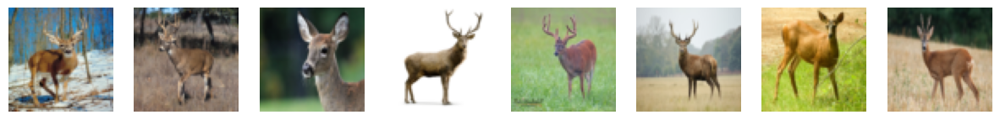

In [3]:
# Check the length of the dataset
print(f"Length of the dataset: {len(train_dataset)}")

# Visualize some images from the dataset
import matplotlib.pyplot as plt

def visualize_images(dataset, num_images=5):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
    for i in range(num_images):
        # Get an image from the dataset
        image = dataset[i]["pixel_values"]  # Access the preprocessed tensor
        # Convert tensor to numpy and denormalize
        image = image.permute(1, 2, 0).cpu().numpy()  # Change from (C, H, W) to (H, W, C)
        image = (image * 0.5) + 0.5  # Denormalize from [-1, 1] to [0, 1]
        axes[i].imshow(image)
        axes[i].axis("off")
    plt.show()

# Visualize 5 images
visualize_images(train_dataset, num_images=8)

## Generate images from the trained model

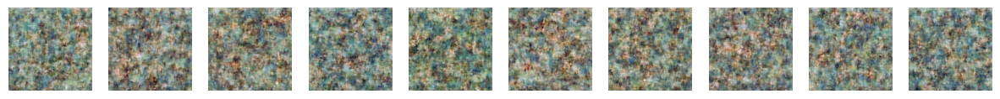

In [4]:
import torch
from diffusers import DDPMScheduler
from diffusers import UNet2DModel
import matplotlib.pyplot as plt

# Load the trained model
model = UNet2DModel(
    sample_size=64,  # Match the image size used during training
    in_channels=3,
    out_channels=3,
    layers_per_block=2,
    block_out_channels=(64, 128, 256, 512),  # Number of channels in each block
    down_block_types=(
        "DownBlock2D",     # Downsampling blocks
        "DownBlock2D",
        "AttnDownBlock2D", # Downsampling blocks with attention
        "AttnDownBlock2D",
    ),
    up_block_types=(
        "AttnUpBlock2D",   # Upsampling blocks with attention
        "AttnUpBlock2D",
        "UpBlock2D",       # Upsampling blocks
        "UpBlock2D"),
).to("cuda")

# Load the saved model weights
model.load_state_dict(torch.load("animal_diffusion_model.pth"))
model.eval()  # Set the model to evaluation mode

# Set up the noise scheduler
noise_scheduler = DDPMScheduler(num_train_timesteps=1000)

# Function to generate images
def generate_images(num_images=1):
    with torch.no_grad():  # Disable gradient computation
        # Start from random noise
        noise = torch.randn((num_images, 3, 256, 256)).to("cuda")  # Match input dimensions
        images = noise

        # Denoising loop
        for t in noise_scheduler.timesteps:
            # Predict the noise residual
            noise_pred = model(images, t).sample

            # Compute the previous noisy sample x_t-1
            images = noise_scheduler.step(noise_pred, t, images).prev_sample

        # Convert images to CPU and denormalize
        images = images.detach().cpu()
        images = (images * 0.5) + 0.5  # Denormalize from [-1, 1] to [0, 1]
        images = torch.clamp(images, 0, 1)  # Clamp to valid pixel range
        return images

# Generate and visualize images
num_images = 10 #limits to 10 , and generate for 5 times
generated_images = generate_images(num_images)

# Plot the generated images
fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
for i, img in enumerate(generated_images):
    img = img.permute(1, 2, 0)  # Change from (C, H, W) to (H, W, C)
    axes[i].imshow(img)
    axes[i].axis("off")
plt.show()

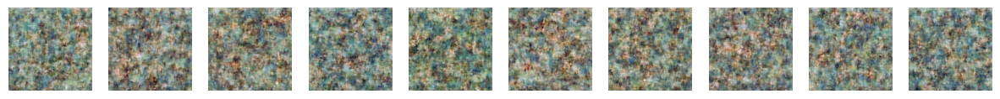

In [5]:
import os
from matplotlib import pyplot as plt

# Create a directory to save the images
os.makedirs("images", exist_ok=True)

# Plot and save the generated images
fig, axes = plt.subplots(1, num_images, figsize=(15, 3))
for i, img in enumerate(generated_images):
    img = img.permute(1, 2, 0)  # Change from (C, H, W) to (H, W, C)
    axes[i].imshow(img)
    axes[i].axis("off")

    # Save each image with a zero-padded two-digit number
    filename = f"images/animal_{i:02d}.png"
    plt.imsave(filename, img.numpy())

# Save the entire grid of images
plt.savefig("images/animal_grid.png")
plt.show()

In [6]:
# !rm -rf images/

# Utility to zip a file
import shutil
shutil.make_archive("animals", "zip", "images")

'/content/animals.zip'